**1) Introduction**

Retails stores like Walmart rely heavily on their inventory related supply chain logistics and is a key factor for them to make profit. 
The motivation of this work is to reduce the gap between supply and demand of goods sold by Walmart to customers all around the world.

This helps Walmart minimize inventory problems at these stores and also ensure customer satisfaction.
Additionally, this helps Walmart reduce wastage, and save costs since mapping demand to supply would mean more products when demand is high and fewer products when demand is lower.

We intend to solve the problem by using machine learning models in the domain of regression.
This machine learning model can be employed in various industries, in which demand and supply can be met at the same time.


###**3) Dataset**

The dataset is walmart.csv from the website - https://www.kaggle.com/datasets/yasserh/walmart-dataset

###**4) Approach**


1.   We did an exploratory data analysis from which we got some interesting  insights in the data-
    *   Temperature influences weekly sales.The weeks having extremely high and low tempratures have less weekly sales
    *    The holidays influence weekly sales. The holidays have higher average weekly sales
    *   Another effect of holiday on sales. December has the highest average weekly sales. This is probably due to Christmas.

2.   Feature selection and feature engineering
    *   Implemented correlation matrix to find the relation between different factors.
    *   Split the training and test set in 80-20 ratio.

3.   Created a Baseline using mean as the baseline by implementing dummy regressor.

    *   Implemented a Pipeline which used Robust Scaler and predicted the weekly sales using Temprature,Fuel Price,CPI ,Unemployment rate.
    *   Calculated mean squared error for the baseline.

4.    Implementing and Evaluating different ML models
    *   The ML models were implemented using ML Pipeline and used RobustScaler. 
    *   To find the best hyper parameters for each ML model
        * Grid Search Cross Validation was used.
        * Negative Root Mean Squared Error was used as the evaluation measure.

5.    The Best Model was selected
    *   The Best Model was Gradient Boosting Regression because it has the least Negative Root Mean Squared Error.
    *   The Best Hyper Parameters were also obtained.

6.    The Best Model was tested on Testing data set to predict the weekly sales
    *   The Mean squared error, Mean absolute error and R2 score were found out.
7.    The Gradient Boosting Regressor is 96.975% accurate.


### 7) **Code and Analysis-**

In [1]:
# Importing the libraries
import pandas as pd
import numpy as np
import altair as alt
import numpy as np
from sklearn.model_selection import train_test_split
from sklearn.compose import ColumnTransformer
from sklearn.preprocessing import OneHotEncoder
from sklearn.preprocessing import RobustScaler
from sklearn.compose import make_column_transformer
from sklearn.pipeline import Pipeline
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.dummy import DummyRegressor
from sklearn.metrics import mean_squared_error
from sklearn.metrics import mean_absolute_error
from sklearn.metrics import r2_score
from sklearn.linear_model import LinearRegression
from sklearn.ensemble import RandomForestRegressor
from sklearn.linear_model import Ridge
from sklearn.neighbors import KNeighborsRegressor
from sklearn.ensemble import GradientBoostingRegressor
from sklearn.neural_network import MLPRegressor
from sklearn.svm import SVR
from sklearn.linear_model import ElasticNet
from sklearn.linear_model import BayesianRidge
from sklearn.ensemble import AdaBoostRegressor
from sklearn.model_selection import GridSearchCV
#from google.colab import files
import warnings
warnings.filterwarnings("ignore")


In [2]:
# Fill the data of walmart.csv in. data dataframe.
data=pd.read_csv("Walmart.csv")

In [3]:
# Understanding data
data.head()

,Store,Date,Weekly_Sales,Holiday_Flag,Temperature,Fuel_Price,CPI,Unemployment
0,1,05-02-2010,1643690.90,0,42.31,2.572,211.096358,8.106
1,1,12-02-2010,1641957.44,1,38.51,2.548,211.242170,8.106
2,1,19-02-2010,1611968.17,0,39.93,2.514,211.289143,8.106
3,1,26-02-2010,1409727.59,0,46.63,2.561,211.319643,8.106
4,1,05-03-2010,1554806.68,0,46.50,2.625,211.350143,8.106


In [4]:
# Understanding data
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 6435 entries, 0 to 6434
Data columns (total 8 columns):
 #   Column        Non-Null Count  Dtype  
---  ------        --------------  -----  
 0   Store         6435 non-null   int64  
 1   Date          6435 non-null   object 
 2   Weekly_Sales  6435 non-null   float64
 3   Holiday_Flag  6435 non-null   int64  
 4   Temperature   6435 non-null   float64
 5   Fuel_Price    6435 non-null   float64
 6   CPI           6435 non-null   float64
 7   Unemployment  6435 non-null   float64
dtypes: float64(5), int64(2), object(1)
memory usage: 402.3+ KB


**No null values in the dataset**

In [5]:
# Understanding data
data.describe()

,Store,Weekly_Sales,Holiday_Flag,Temperature,Fuel_Price,CPI,Unemployment
count,6435.000000,6.435000e+03,6435.000000,6435.000000,6435.000000,6435.000000,6435.000000
mean,23.000000,1.046965e+06,0.069930,60.663782,3.358607,171.578394,7.999151
std,12.988182,5.643666e+05,0.255049,18.444933,0.459020,39.356712,1.875885
min,1.000000,2.099862e+05,0.000000,-2.060000,2.472000,126.064000,3.879000
25%,12.000000,5.533501e+05,0.000000,47.460000,2.933000,131.735000,6.891000
50%,23.000000,9.607460e+05,0.000000,62.670000,3.445000,182.616521,7.874000
75%,34.000000,1.420159e+06,0.000000,74.940000,3.735000,212.743293,8.622000
max,45.000000,3.818686e+06,1.000000,100.140000,4.468000,227.232807,14.313000


### Exploratory Data Analysis

**Relation of different features with the weekly sales**

In [6]:
alt.data_transformers.disable_max_rows()

DataTransformerRegistry.enable('default')

Average weekly sales for different stores.

In [7]:
alt.Chart(data,title="average weekly sales for the different stores").mark_bar().encode(
x='Store',
y='mean(Weekly_Sales)').properties(width=700,height=550)

alt.Chart(...)

There is no apparent pattern between the store number and weekly sales.

Temperature vs weekly sale

In [8]:

alt.Chart(data,title="Temperature vs Weekly Sales").mark_point(size=40).encode(
x='Temperature',
y='mean(Weekly_Sales)').properties(width=700,height=550)

alt.Chart(...)

Temeprature in a range vs weekly sales

In [9]:
alt.Chart(data).mark_bar().encode(
    alt.X("Temperature:Q", bin=True),
    y='Weekly_Sales',
)

alt.Chart(...)

The weeks having extremely high and low tempratures have less weekly sales

Holidays vs weekly sales

In [10]:
data['Holiday_Flag'].value_counts()

0    5985
1     450
Name: Holiday_Flag, dtype: int64

In [11]:
alt.Chart(data,title='Holiday Flag vs weekly sales').mark_bar().encode(
    alt.X("Holiday_Flag:O"),
    y='mean(Weekly_Sales)',
    color='Holiday_Flag'
).properties(width=200,height=350)

alt.Chart(...)

As expected, holidays have higher average weekly sales

Fuel price vs Weekly sales.

In [12]:
alt.Chart(data,title="Fuel Price vs Weekly Sales").mark_line().encode(
x='Fuel_Price',
y='mean(Weekly_Sales)').properties(width=600,height=550)

alt.Chart(...)

Consumer Price Index vs Weekly sales

In [13]:
alt.Chart(data,title="CPI vs Weekly Sales").mark_line().encode(
x='CPI',
y='mean(Weekly_Sales)').properties(width=600,height=550)

alt.Chart(...)

Unemployment rate vs Weekly sales


In [14]:
alt.Chart(data,title="Unemployment Rate vs Weekly Sales").mark_line().encode(
x='Unemployment',
y='mean(Weekly_Sales)').properties(width=600,height=550)

alt.Chart(...)

There is no apparent relationship between the weekly sales and fuel price,cpi or unemployment

Splitting the Date to weeks, months and years.

Week, Month and years vs weekly sales

In [15]:
data["Date"] = pd.to_datetime(data["Date"]) # convert to datetime
data['week'] =data['Date'].dt.week
data['month'] =data['Date'].dt.month 
data['year'] =data['Date'].dt.year

In [16]:
data['Weekly_Sales'] = data['Weekly_Sales'].fillna(0).astype(np.int64)
data['Weekly_Sales'] = data['Weekly_Sales'].astype('Int64')

In [17]:
data.groupby('month')['Weekly_Sales'].mean() # to see the best months for sales


month
1      947613.448889
2     1054596.852525
3         1024974.35
4      1024323.14127
5     1035378.294017
6      1064847.57963
7     1014211.362393
8      1044873.02037
9     1009456.350427
10    1030630.041026
11    1133750.958025
12    1210254.246465
Name: Weekly_Sales, dtype: Float64

In [18]:
data.groupby('year')['Weekly_Sales'].mean()



year
2010    1059669.009259
2011    1046238.826068
2012    1033659.902326
Name: Weekly_Sales, dtype: Float64

In [19]:
alt.Chart(data,title="average weekly sales per month").mark_bar().encode(
x='month',
y='mean(Weekly_Sales)',
color="month:N"
).properties(width=700,height=550)

alt.Chart(...)

**December has the highest average weekly sales. This is probably due to Christmas.**

In [20]:
chart = alt.Chart(data,title="average weekly sales per week").mark_bar().encode(
x='week',
y='mean(Weekly_Sales)',
color="week:N"
).properties(width=700,height=550)

chart.display()

alt.Chart(...)

In [21]:
alt.Chart(data,title='Year and month vs weekly sales').mark_bar().encode(
    x = "month:N",
    y='Weekly_Sales',
    column='year:O',
    color='year:O'
).properties(width=200,height=350)

alt.Chart(...)

###Feature selection  and Feature engineering

Text(0.5, 1.0, 'Correlation Matrix')

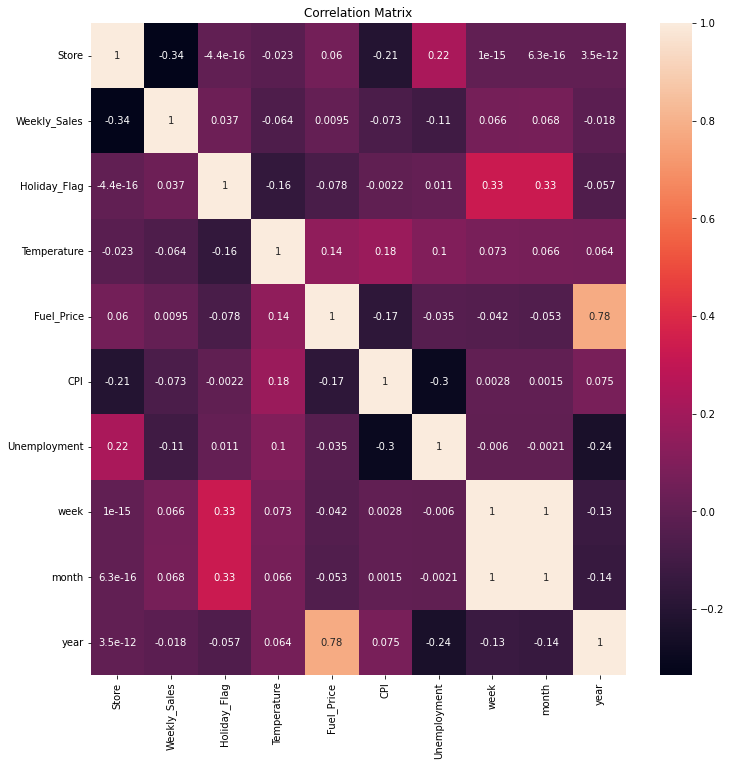

In [22]:
plt.figure(figsize=(12,12))
sns.heatmap(data.corr(),annot=True)
plt.title('Correlation Matrix')

As per the correlation matrix, the store has a negative correlation with the weekly sales.


In [23]:
features = ['Store', 'Holiday_Flag', 'Temperature','Fuel_Price','CPI','Unemployment','week', 'month','year']
X = data[features]
y = data['Weekly_Sales']

In [24]:

# Splitting into training and testing
X_train,X_test,y_train,y_test=train_test_split(X,y,test_size=0.2,random_state=25)

In [25]:
# describing X_train
X_train.shape

(5148, 9)

In [26]:
# Describing X
X.head()

,Store,Holiday_Flag,Temperature,Fuel_Price,CPI,Unemployment,week,month,year
0,1,0,42.31,2.572,211.096358,8.106,17,5,2010
1,1,1,38.51,2.548,211.242170,8.106,48,12,2010
2,1,0,39.93,2.514,211.289143,8.106,7,2,2010
3,1,0,46.63,2.561,211.319643,8.106,8,2,2010
4,1,0,46.50,2.625,211.350143,8.106,18,5,2010


#### Creating the baseline

In [27]:
#Using mean as the baseline
dummy_regr = DummyRegressor(strategy="mean") #Using mean as the baseline
col_transformer = ColumnTransformer(
        [('robust_scaler', RobustScaler, ['Temprature','Fuel_Price', 'CPI','Unemployment'])],
        remainder='passthrough'
        )
# using Pipeline
pipe = Pipeline(
        [
         ('robust_scaler', RobustScaler()),
         ('Dummy Regressor', dummy_regr)
        ])

pipe.fit(X_train,y_train)
y_pred=pipe.predict(X_test)
# Prining mean squared error.
print(mean_squared_error(y_test, y_pred))

333966925169.9645


In [28]:
# Column Transformation 
col_transformer = ColumnTransformer(
        [('robust_scaler', RobustScaler, ['Temprature','Fuel_Price', 'CPI','Unemployment'])],
        remainder='passthrough'
        )

# Defining Regression models
lr=LinearRegression() # Linear regressor
rfreg=RandomForestRegressor() # Random Forest regressor
ridge=Ridge() # Ridge regression
knn_reg=KNeighborsRegressor() # K-nearest neighbors regressor
gb_reg=GradientBoostingRegressor() # Gradient boosting regressor
mlp_reg=MLPRegressor() # Multi-Layer Perceptron regression
svr_reg = SVR() # Support Vector machine regression
bayesian_reg = BayesianRidge() # Linear Bayesian Regressor
elasticnet_reg = ElasticNet(random_state=0) #  Elastic Net Regressor
adaboost_reg = AdaBoostRegressor(random_state=0, n_estimators=100) # AdaBoost Regressor

# Defining hyperparameters.

lr_parameters={'Linear_Regression__fit_intercept':[True,False]}

rf_parameters={'Random_Forest_Regressor__n_estimators': [100, 200, 300, 100],
               'Random_Forest_Regressor__min_samples_leaf': [3, 4, 5]}

ridge_parameters={'Ridge_Regressor__alpha': [0.01, 0.1, 1, 10]}

knn_parameters={'KNN_Regressor__n_neighbors':[3,5,7,9,11,13,15,17,21]}

gb_parameters={'Gradient_Boosted_Regressor__max_depth':range(5,16,2),
               'Gradient_Boosted_Regressor__min_samples_split':range(200,1001,200)}

mlp_parameters={'Multi_Layer_Perceptron_Regressor__activation':['identity','relu','logistic'],
                'Multi_Layer_Perceptron_Regressor__alpha':[1.e-06, 1.e-05, 1.e-04, 1.e-03]}

svr_parameters = {'Support_Vector_Regressor__kernel': ['linear', 'rbf', 'poly'],
                  'Support_Vector_Regressor__C': [0.1, 1, 10],
                  'Support_Vector_Regressor__epsilon': [0.01, 0.1, 1],
                  'Support_Vector_Regressor__gamma': ['scale', 'auto', 0.1, 1, 10]
                  }
bayesian_parameters = {
    'Bayesian_Regressor__alpha_1': [1e-6, 1e-4, 1e-2, 1.0],
    'Bayesian_Regressor__alpha_2': [1e-6, 1e-4, 1e-2, 1.0],
    'Bayesian_Regressor__lambda_1': [1e-6, 1e-4, 1e-2, 1.0],
    'Bayesian_Regressor__lambda_2': [1e-6, 1e-4, 1e-2, 1.0],
    'Bayesian_Regressor__tol': [1e-6, 1e-4, 1e-2],
    'Bayesian_Regressor__compute_score': [True, False]
}

elasticnet_parameters = {
    'ElasticNet_Regressor__alpha': [0.1, 1.0, 10.0],
    'ElasticNet_Regressor__l1_ratio': [0.1, 0.5, 0.9],
    'ElasticNet_Regressor__fit_intercept': [True, False],
    'ElasticNet_Regressor__max_iter': [1000, 5000, 10000]
}
adaboost_parameters = {
    'AdaBoost_Regressor__n_estimators': [50, 100, 200],
    'AdaBoost_Regressor__learning_rate': [0.01, 0.1, 1.0],
    'AdaBoost_Regressor__loss': ['linear', 'square', 'exponential']
}


# Defining pipeline for each ML algorithm
lr_pipe=Pipeline(
        [
         ('robust_scaler', RobustScaler()),
         ('Linear_Regression', lr)
        ])

rf_pipe=Pipeline(
        [
         ('robust_scaler', RobustScaler()),
         ('Random_Forest_Regressor', rfreg)
        ])

ridge_pipe=Pipeline(
        [
         ('robust_scaler', RobustScaler()),
         ('Ridge_Regressor', ridge)
        ])

knn_pipe=Pipeline(
        [
         ('robust_scaler', RobustScaler()),
         ('KNN_Regressor', knn_reg)
        ])

gb_pipe=Pipeline(
        [
         ('robust_scaler', RobustScaler()),
         ('Gradient_Boosted_Regressor', gb_reg)
        ])

mlp_pipe=Pipeline(
        [
         ('robust_scaler', RobustScaler()),
         ('Multi_Layer_Perceptron_Regressor', mlp_reg)
        ])


svr_pipe=Pipeline(
        [
         ('robust_scaler', RobustScaler()),
         ('Support_Vector_Regressor', svr_reg)
        ])



bayesian_pipe=Pipeline(
        [
         ('robust_scaler', RobustScaler()),
         ('Bayesian_Regressor', bayesian_reg)
        ])



elasticnet_pipe=Pipeline(
        [
         ('robust_scaler', RobustScaler()),
         ('ElasticNet_Regressor', elasticnet_reg)
        ])



adaboost_pipe=Pipeline(
        [
         ('robust_scaler', RobustScaler()),
         ('AdaBoost_Regressor', adaboost_reg)
        ])




# Uisng grid search and then finding the best score and best hyper parameters.

lr_search=GridSearchCV(lr_pipe, lr_parameters,scoring='neg_root_mean_squared_error')
lr_search.fit(X_train,y_train)
print("---Linear Regression---")
print("Best Score: ",lr_search.best_score_)
print("Best hyperparameters: ",lr_search.best_params_)

rf_search = GridSearchCV(rf_pipe, rf_parameters,scoring='neg_root_mean_squared_error')
rf_search.fit(X_train,y_train)
print("---Random Forest Regressor---")
print("Best Score: ",rf_search.best_score_)
print("Best hyperparameters: ",rf_search.best_params_)

ridge_search = GridSearchCV(ridge_pipe, ridge_parameters,scoring='neg_root_mean_squared_error')
ridge_search.fit(X_train,y_train)
print("---RIdge Regressor---")
print("Best Score: ",ridge_search.best_score_)
print("Best hyperparameters: ",ridge_search.best_params_)

knn_search = GridSearchCV(knn_pipe, knn_parameters,scoring='neg_root_mean_squared_error')
knn_search.fit(X_train,y_train)
print("---KNN Regressor---")
print("Best Score: ",knn_search.best_score_)
print("Best hyperparameters: ",knn_search.best_params_)

gb_search = GridSearchCV(gb_pipe, gb_parameters,scoring='neg_root_mean_squared_error')
gb_search.fit(X_train,y_train)
print("---Gradient Boosted Regressor---")
print("Best Score: ",gb_search.best_score_)
print("Best hyperparameters: ",gb_search.best_params_)

mlp_search = GridSearchCV(mlp_pipe, mlp_parameters,scoring='neg_root_mean_squared_error')
mlp_search.fit(X_train,y_train)
print("---Multi Layer Perceptron Regressor---")
print("Best Score: ",mlp_search.best_score_)
print("Best hyperparameters: ",mlp_search.best_params_)


svr_search = GridSearchCV(svr_pipe, svr_parameters,scoring='neg_root_mean_squared_error')
svr_search.fit(X_train,y_train)
print("---Support Vector Machine Regressor---")
print("Best Score: ",svr_search.best_score_)
print("Best hyperparameters: ",svr_search.best_params_)


bayesian_search = GridSearchCV(bayesian_pipe, bayesian_parameters,scoring='neg_root_mean_squared_error')
bayesian_search.fit(X_train,y_train)
print("---Bayesian Linear Regressor---")
print("Best Score: ",bayesian_search.best_score_)
print("Best hyperparameters: ",bayesian_search.best_params_)


elasticnet_search = GridSearchCV(elasticnet_pipe, elasticnet_parameters,scoring='neg_root_mean_squared_error')
elasticnet_search.fit(X_train,y_train)
print("---Elastic Net Regressor---")
print("Best Score: ",elasticnet_search.best_score_)
print("Best hyperparameters: ",elasticnet_search.best_params_)


adaboost_search = GridSearchCV(adaboost_pipe, adaboost_parameters,scoring='neg_root_mean_squared_error')
adaboost_search.fit(X_train,y_train)
print("---AdaBoost Regressor---")
print("Best Score: ",adaboost_search.best_score_)
print("Best hyperparameters: ",adaboost_search.best_params_)



---Linear Regression---
Best Score:  -520974.1026774957
Best hyperparameters:  {'Linear_Regression__fit_intercept': True}
---Random Forest Regressor---
Best Score:  -130155.4404168309
Best hyperparameters:  {'Random_Forest_Regressor__min_samples_leaf': 3, 'Random_Forest_Regressor__n_estimators': 200}
---RIdge Regressor---
Best Score:  -520926.9845732943
Best hyperparameters:  {'Ridge_Regressor__alpha': 10}
---KNN Regressor---
Best Score:  -433794.925061016
Best hyperparameters:  {'KNN_Regressor__n_neighbors': 5}
---Gradient Boosted Regressor---
Best Score:  -104749.48693785764
Best hyperparameters:  {'Gradient_Boosted_Regressor__max_depth': 13, 'Gradient_Boosted_Regressor__min_samples_split': 200}
---Multi Layer Perceptron Regressor---
Best Score:  -1178244.1671995441
Best hyperparameters:  {'Multi_Layer_Perceptron_Regressor__activation': 'identity', 'Multi_Layer_Perceptron_Regressor__alpha': 1e-06}
---Support Vector Machine Regressor---
Best Score:  -486588.95486113604
Best hyperparam

### Selection of best model

In [29]:
# Get the best score
gb_search.best_score_


-104749.48693785764

Gradient booster is the best model because of its least negative root mean squared error.

In [30]:
gb_search.best_params_

{'Gradient_Boosted_Regressor__max_depth': 13,
 'Gradient_Boosted_Regressor__min_samples_split': 200}

Running the best model on Test data set.

In [31]:
best_model = gb_search.best_estimator_
best_model.fit(X_train, y_train)

Pipeline(steps=[('robust_scaler', RobustScaler()),
                ('Gradient_Boosted_Regressor',
                 GradientBoostingRegressor(max_depth=13,
                                           min_samples_split=200))])

In [32]:
y_pred = best_model.predict(X_test)
mse = mean_squared_error(y_test, y_pred,squared=False)
mae = mean_absolute_error(y_test, y_pred)
r2score = r2_score(y_test,y_pred)


Accuracy of model


In [33]:
print('After testing')

print('Root Mean Squared Error:', mse)
print('Test Mean Absolute Error:', mae)
print('Test R2 score:', r2score)

After testing
Root Mean Squared Error: 100405.55526615247
Test Mean Absolute Error: 60256.34145924637
Test R2 score: 0.9697581254989537


In [34]:
print('The Gradient Boosting Algorithm explains ',r2score*100, '% of the variation in the data')

The Gradient Boosting Algorithm explains  96.97581254989537 % of the variation in the data


In [35]:
feature_imp=pd.DataFrame(data={'Features':list(X.columns),"importance":list(best_model['Gradient_Boosted_Regressor'].feature_importances_)})

In [36]:
alt.Chart(feature_imp,title='Gradient Boosted Regression Feature Importance').mark_bar().encode(
    x = "Features",
    y='importance',
    color='Features'
).properties(width=500,height=450)

alt.Chart(...)